# PyTorch implementation of the StyleGAN Generator
*by Piotr Bialecki and Thomas Viehmann*

We implement the generator of *T. Karras et al., A Style-Based Generator Architecture for Generative Adversarial Networks* in PyTorch. 

StyleGAN's photorealistic faces are an intriguing GAN output.
While diving deep into the architecture we found that a good way to do this, is to provide a simple notebook which recreates the StyleGAN for use with the pretrained weights.

Also we can always learn a few tricks when doing something as this, let's take a look.

[Karras et al. provide a reference implementation and links to weights, paper, and video](https://github.com/NVlabs/stylegan).

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F

from collections import OrderedDict
import pickle

import numpy as np

import IPython


### Anything new in the linear layer?

Did you just yawn, when you saw linear layer? Not so fast!

There is a trick that is maybe not as well known (I should be grateful if anyone pointed out a reference): While it is very common to use targeted initialization such as the method of K. He (`torch.nn.kaiming_normal_` and `torch.nn.kaiming_normal_`), if we actually don't scale the parameter but multiply the factor separately, the same factor also scales the gradients and thus, for methods like stochastic gradient descent (SGD) the updates. (For optimizers that remove scaling such as Adam, one would expect the effect to cancel with the modification in Adam's scaling.)

Vaguely connected, [H Zhang et al. *Fixup Initialization: Residual Learning Without Normalization*](https://openreview.net/forum?id=H1gsz30cKX) suggest to have (but trainable) scalar multipliers.

So here is the linear layer.

In [2]:
class MyLinear(nn.Module):
    """Linear layer with equalized learning rate and custom learning rate multiplier."""
    def __init__(self, input_size, output_size, gain=2**(0.5), use_wscale=False, lrmul=1, bias=True):
        super().__init__()
        he_std = gain * input_size**(-0.5) # He init
        # Equalized learning rate and custom learning rate multiplier.
        if use_wscale:
            init_std = 1.0 / lrmul
            self.w_mul = he_std * lrmul
        else:
            init_std = he_std / lrmul
            self.w_mul = lrmul
        self.weight = torch.nn.Parameter(torch.randn(output_size, input_size) * init_std)
        if bias:
            self.bias = torch.nn.Parameter(torch.zeros(output_size))
            self.b_mul = lrmul
        else:
            self.bias = None

    def forward(self, x):
        bias = self.bias
        if bias is not None:
            bias = bias * self.b_mul
        return F.linear(x, self.weight * self.w_mul, bias)

### Convolution Layer

The convolution layer uses the same trick as the linear layer.

As the architecture of StyleGAN prescribes that during upscaling, blurring occurs between bias addition and (I didn't look into detail why it doesn't seem to commute), we need to provide a mechanism to have an intermediate step between them.
For larger resolutions, the authors also propose a fused convolution / upscaling which is *not* equivalent to the two separate operations. (The "averaging" of the weight isn't actually an average, but an addition, that would seem to effectively multiply the weight by four, but I don't know how compatible it would be even without this effect.)

If we don't have the two, we use the regular convolution with bias.

In [3]:
class MyConv2d(nn.Module):
    """Conv layer with equalized learning rate and custom learning rate multiplier."""
    def __init__(self, input_channels, output_channels, kernel_size, gain=2**(0.5), use_wscale=False, lrmul=1, bias=True,
                intermediate=None, upscale=False):
        super().__init__()
        if upscale:
            self.upscale = Upscale2d()
        else:
            self.upscale = None
        he_std = gain * (input_channels * kernel_size ** 2) ** (-0.5) # He init
        self.kernel_size = kernel_size
        if use_wscale:
            init_std = 1.0 / lrmul
            self.w_mul = he_std * lrmul
        else:
            init_std = he_std / lrmul
            self.w_mul = lrmul
        self.weight = torch.nn.Parameter(torch.randn(output_channels, input_channels, kernel_size, kernel_size) * init_std)
        if bias:
            self.bias = torch.nn.Parameter(torch.zeros(output_channels))
            self.b_mul = lrmul
        else:
            self.bias = None
        self.intermediate = intermediate

    def forward(self, x):
        bias = self.bias
        if bias is not None:
            bias = bias * self.b_mul
        
        have_convolution = False
        if self.upscale is not None and min(x.shape[2:]) * 2 >= 128:
            # this is the fused upscale + conv from StyleGAN, sadly this seems incompatible with the non-fused way
            # this really needs to be cleaned up and go into the conv...
            w = self.weight * self.w_mul
            w = w.permute(1, 0, 2, 3)
            # probably applying a conv on w would be more efficient. also this quadruples the weight (average)?!
            w = F.pad(w, (1,1,1,1))
            w = w[:, :, 1:, 1:]+ w[:, :, :-1, 1:] + w[:, :, 1:, :-1] + w[:, :, :-1, :-1]
            x = F.conv_transpose2d(x, w, stride=2, padding=(w.size(-1)-1)//2)
            have_convolution = True
        elif self.upscale is not None:
            x = self.upscale(x)
    
        if not have_convolution and self.intermediate is None:
            return F.conv2d(x, self.weight * self.w_mul, bias, padding=self.kernel_size//2)
        elif not have_convolution:
            x = F.conv2d(x, self.weight * self.w_mul, None, padding=self.kernel_size//2)
        
        if self.intermediate is not None:
            x = self.intermediate(x)
        if bias is not None:
            x = x + bias.view(1, -1, 1, 1)
        return x

### Noise Layer

The noise layer adds gaussian noise of learnable standard deviation (and zero mean). The noise itself is per-pixel (and image in the minibatch), but constant over the channels. Note that the learnable standard deviation is per channel.
As you can see when you feed the same latent into the model several times, the effects are not all that large, but in the detail.

There is a little trick in the code: if you set .noise for the noise layer, you can fix the noise. This is one of the tricks to use when checking against a reference implementation - this way you can get a 1-1 correspondence of outputs.

In [4]:
class NoiseLayer(nn.Module):
    """adds noise. noise is per pixel (constant over channels) with per-channel weight"""
    def __init__(self, channels):
        super().__init__()
        self.weight = nn.Parameter(torch.zeros(channels))
        self.noise = None
    
    def forward(self, x, noise=None):
        if noise is None and self.noise is None:
            noise = torch.randn(x.size(0), 1, x.size(2), x.size(3), device=x.device, dtype=x.dtype)
        elif noise is None:
            # here is a little trick: if you get all the noiselayers and set each
            # modules .noise attribute, you can have pre-defined noise.
            # Very useful for analysis
            noise = self.noise
        x = x + self.weight.view(1, -1, 1, 1) * noise
        return x  

### Style Modification layer

In the generator, a style modification layer is used after each (non-affine) instance norm layer. Recall that the instance norm normalizes the mean and standard deviation across pixels separately for each channel (and sample).
So here we put back a mean and variance, but not just arbitrary learnable parameters, but as the output of a linear layer which takes the latent style vector as inputs. So in a way, this is the affine part of the instance norm, but with calculated parameters.
The article call the affine Instance Norm *Adaptive Instance Norm (AdaIN)*.

In [5]:
class StyleMod(nn.Module):
    def __init__(self, latent_size, channels, use_wscale):
        super(StyleMod, self).__init__()
        self.lin = MyLinear(latent_size,
                            channels * 2,
                            gain=1.0, use_wscale=use_wscale)
        
    def forward(self, x, latent):
        style = self.lin(latent) # style => [batch_size, n_channels*2]
        shape = [-1, 2, x.size(1)] + (x.dim() - 2) * [1]
        style = style.view(shape)  # [batch_size, 2, n_channels, ...]
        x = x * (style[:, 0] + 1.) + style[:, 1]
        return x

### Pixelnorm

Pixelnorm normalizes per pixel across all channels.

Note that the default configuration only use the pixel norm in the g_mapping. There it effectively forces the empirical standard deviation of the latent vector to be one.

In [6]:
class PixelNormLayer(nn.Module):
    def __init__(self, epsilon=1e-8):
        super().__init__()
        self.epsilon = epsilon
    def forward(self, x):
        return x * torch.rsqrt(torch.mean(x**2, dim=1, keepdim=True) + self.epsilon)

# Upscale and blur layers

The StyleGAN has two types of upscaling. For the plain one, where you just set a block of 2x2 pixels to the value of the pixel to arrive an image that is scaled by 2. No fancy stuff like bilinear or bicubic interpolation. The alternative way - "fused" with convolution - uses a stride 2 transposed convolution instead. Note from above that they seem to not be quite equivalent (at least not with the same parametrisation).
Both of these will have blocky results. To mitigate, the generator blurs the layer, by convolving with the simplest possible smoothing kernel.


In [7]:
class BlurLayer(nn.Module):
    def __init__(self, kernel=[1, 2, 1], normalize=True, flip=False, stride=1):
        super(BlurLayer, self).__init__()
        kernel=[1, 2, 1]
        kernel = torch.tensor(kernel, dtype=torch.float32)
        kernel = kernel[:, None] * kernel[None, :]
        kernel = kernel[None, None]
        if normalize:
            kernel = kernel / kernel.sum()
        if flip:
            kernel = kernel[:, :, ::-1, ::-1]
        self.register_buffer('kernel', kernel)
        self.stride = stride
    
    def forward(self, x):
        # expand kernel channels
        kernel = self.kernel.expand(x.size(1), -1, -1, -1)
        x = F.conv2d(
            x,
            kernel,
            stride=self.stride,
            padding=int((self.kernel.size(2)-1)/2),
            groups=x.size(1)
        )
        return x

def upscale2d(x, factor=2, gain=1):
    assert x.dim() == 4
    if gain != 1:
        x = x * gain
    if factor != 1:
        shape = x.shape
        x = x.view(shape[0], shape[1], shape[2], 1, shape[3], 1).expand(-1, -1, -1, factor, -1, factor)
        x = x.contiguous().view(shape[0], shape[1], factor * shape[2], factor * shape[3])
    return x

class Upscale2d(nn.Module):
    def __init__(self, factor=2, gain=1):
        super().__init__()
        assert isinstance(factor, int) and factor >= 1
        self.gain = gain
        self.factor = factor
    def forward(self, x):
        return upscale2d(x, factor=self.factor, gain=self.gain)

### Generator Mapping Module

With all these building blocks done, we can actually define the StyleGAN generator.
The first component is the mapping. It's a reasonably deep (8 layers) but otherwise very plain vanilla fully connected network aka Multi-Layer-Perceptron. The StyleGAN reference model uses Leaky ReLUs, so we do, too.
Note that while we get an 18-channel (times 512 features) per image style matrix, all 18 channels will be the same. 

We also provide a truncation module pulling the upper layer's latent inputs towards the mean, but we don't activate it as the mean is not provided in the pre-trained network. We could run the mapping for a while and derive the truncation weights.

In [8]:
class G_mapping(nn.Sequential):
    def __init__(self, nonlinearity='lrelu', use_wscale=True):
        act, gain = {'relu': (torch.relu, np.sqrt(2)),
                     'lrelu': (nn.LeakyReLU(negative_slope=0.2), np.sqrt(2))}[nonlinearity]
        layers = [
            ('pixel_norm', PixelNormLayer()),
            ('dense0', MyLinear(512, 512, gain=gain, lrmul=0.01, use_wscale=use_wscale)),
            ('dense0_act', act),
            ('dense1', MyLinear(512, 512, gain=gain, lrmul=0.01, use_wscale=use_wscale)),
            ('dense1_act', act),
            ('dense2', MyLinear(512, 512, gain=gain, lrmul=0.01, use_wscale=use_wscale)),
            ('dense2_act', act),
            ('dense3', MyLinear(512, 512, gain=gain, lrmul=0.01, use_wscale=use_wscale)),
            ('dense3_act', act),
            ('dense4', MyLinear(512, 512, gain=gain, lrmul=0.01, use_wscale=use_wscale)),
            ('dense4_act', act),
            ('dense5', MyLinear(512, 512, gain=gain, lrmul=0.01, use_wscale=use_wscale)),
            ('dense5_act', act),
            ('dense6', MyLinear(512, 512, gain=gain, lrmul=0.01, use_wscale=use_wscale)),
            ('dense6_act', act),
            ('dense7', MyLinear(512, 512, gain=gain, lrmul=0.01, use_wscale=use_wscale)),
            ('dense7_act', act)
        ]
        super().__init__(OrderedDict(layers))
        
    def forward(self, x):
        x = super().forward(x)
        # Broadcast
        x = x.unsqueeze(1).expand(-1, 18, -1)
        return x

class Truncation(nn.Module):
    def __init__(self, avg_latent, max_layer=8, threshold=0.7):
        super().__init__()
        self.max_layer = max_layer
        self.threshold = threshold
        self.register_buffer('avg_latent', avg_latent)
    def forward(self, x):
        assert x.dim() == 3
        interp = torch.lerp(self.avg_latent, x, self.threshold)
        do_trunc = (torch.arange(x.size(1)) < self.max_layer).view(1, -1, 1)
        return torch.where(do_trunc, interp, x)

### Generator Synthesis Blocks

Each Block consists of two halfs. Each of these halfs does the following:
- Upscaling (if it's the first half) by a factor of two and blurring - fused with the convolution for the later layers
- Convolution (if it's the first half, halving the channels for the later layers)
- Noise
- Activation (LeakyReLU in the reference model)
- Optionally Pixel Norm (**not used** in the reference model)
- Instance Norm (optional, but used in the reference model)
- The style modulation (i.e. setting the mean/standard deviation of the outputs after instance norm, see above)

Two of these sequences form a block that typically has `out_channels = in_channels//2` (in the earlier blocks, there are 512 input and 512 output channels) and `output_resolution = input_resolution * 2`.
We combine all but the first two into a Module called the Layer Epilogue (the term taken from the original code).
Note that the original implementation moves the bias of the convolution after the noise, but those two commute, so it doesn't matter.

The first block (4x4 "pixels") doesn't have an input. The result of the first convolution is just replaced by a (trained) constant. We call it the `InputBlock`, the others `GSynthesisBlock`.
(It might be nicer to do this the other way round, i.e. have the `LayerEpilogue` be the Layer and call the conv from that.)

In [9]:
class LayerEpilogue(nn.Module):
    """Things to do at the end of each layer."""
    def __init__(self, channels, dlatent_size, use_wscale, use_noise, use_pixel_norm, use_instance_norm, use_styles, activation_layer):
        super().__init__()
        layers = []
        if use_noise:
            layers.append(('noise', NoiseLayer(channels)))
        layers.append(('activation', activation_layer))
        if use_pixel_norm:
            layers.append(('pixel_norm', PixelNorm()))
        if use_instance_norm:
            layers.append(('instance_norm', nn.InstanceNorm2d(channels)))
        self.top_epi = nn.Sequential(OrderedDict(layers))
        if use_styles:
            self.style_mod = StyleMod(dlatent_size, channels, use_wscale=use_wscale)
        else:
            self.style_mod = None
    def forward(self, x, dlatents_in_slice=None):
        x = self.top_epi(x)
        if self.style_mod is not None:
            x = self.style_mod(x, dlatents_in_slice)
        else:
            assert dlatents_in_slice is None
        return x


class InputBlock(nn.Module):
    def __init__(self, nf, dlatent_size, const_input_layer, gain, use_wscale, use_noise, use_pixel_norm, use_instance_norm, use_styles, activation_layer):
        super().__init__()
        self.const_input_layer = const_input_layer
        self.nf = nf
        if self.const_input_layer:
            # called 'const' in tf
            self.const = nn.Parameter(torch.ones(1, nf, 4, 4))
            self.bias = nn.Parameter(torch.ones(nf))
        else:
            self.dense = MyLinear(dlatent_size, nf*16, gain=gain/4, use_wscale=use_wscale) # tweak gain to match the official implementation of Progressing GAN
        self.epi1 = LayerEpilogue(nf, dlatent_size, use_wscale, use_noise, use_pixel_norm, use_instance_norm, use_styles, activation_layer)
        self.conv = MyConv2d(nf, nf, 3, gain=gain, use_wscale=use_wscale)
        self.epi2 = LayerEpilogue(nf, dlatent_size, use_wscale, use_noise, use_pixel_norm, use_instance_norm, use_styles, activation_layer)
        
    def forward(self, dlatents_in_range):
        batch_size = dlatents_in_range.size(0)
        if self.const_input_layer:
            x = self.const.expand(batch_size, -1, -1, -1)
            x = x + self.bias.view(1, -1, 1, 1)
        else:
            x = self.dense(dlatents_in_range[:, 0]).view(batch_size, self.nf, 4, 4)
        x = self.epi1(x, dlatents_in_range[:, 0])
        x = self.conv(x)
        x = self.epi2(x, dlatents_in_range[:, 1])
        return x


class GSynthesisBlock(nn.Module):
    def __init__(self, in_channels, out_channels, blur_filter, dlatent_size, gain, use_wscale, use_noise, use_pixel_norm, use_instance_norm, use_styles, activation_layer):
        # 2**res x 2**res # res = 3..resolution_log2
        super().__init__()
        if blur_filter:
            blur = BlurLayer(blur_filter)
        else:
            blur = None
        self.conv0_up = MyConv2d(in_channels, out_channels, kernel_size=3, gain=gain, use_wscale=use_wscale,
                                 intermediate=blur, upscale=True)
        self.epi1 = LayerEpilogue(out_channels, dlatent_size, use_wscale, use_noise, use_pixel_norm, use_instance_norm, use_styles, activation_layer)
        self.conv1 = MyConv2d(out_channels, out_channels, kernel_size=3, gain=gain, use_wscale=use_wscale)
        self.epi2 = LayerEpilogue(out_channels, dlatent_size, use_wscale, use_noise, use_pixel_norm, use_instance_norm, use_styles, activation_layer)
            
    def forward(self, x, dlatents_in_range):
        x = self.conv0_up(x)
        x = self.epi1(x, dlatents_in_range[:, 0])
        x = self.conv1(x)
        x = self.epi2(x, dlatents_in_range[:, 1])
        return x

# Generator - Synthesis part

Finally, the synthesis part just stacks 9 blocks (input + 8 resolution doubling) and a pixelwise (1x1) convolution from 16 channels to RGB (3 channels).
Note that lower resolution RGB convolutions don't seem to serve any purpose in the final model. (And we don't think that they produce images as they once did during the training - but the parameter file contains parameters, so we have the modules here. The alternative would be to filter out the weights).
The reference implementation's somewhat convoluted setup in the "recursive" mode is mainly to provide a single static graph for all stages of the progressive training. It would be interesting to reimplement the full training in PyTorch, making use of the dynamic graphs.


In [10]:
class G_synthesis(nn.Module):
    def __init__(self,
        dlatent_size        = 512,          # Disentangled latent (W) dimensionality.
        num_channels        = 3,            # Number of output color channels.
        resolution          = 1024,         # Output resolution.
        fmap_base           = 8192,         # Overall multiplier for the number of feature maps.
        fmap_decay          = 1.0,          # log2 feature map reduction when doubling the resolution.
        fmap_max            = 512,          # Maximum number of feature maps in any layer.
        use_styles          = True,         # Enable style inputs?
        const_input_layer   = True,         # First layer is a learned constant?
        use_noise           = True,         # Enable noise inputs?
        randomize_noise     = True,         # True = randomize noise inputs every time (non-deterministic), False = read noise inputs from variables.
        nonlinearity        = 'lrelu',      # Activation function: 'relu', 'lrelu'
        use_wscale          = True,         # Enable equalized learning rate?
        use_pixel_norm      = False,        # Enable pixelwise feature vector normalization?
        use_instance_norm   = True,         # Enable instance normalization?
        dtype               = torch.float32,  # Data type to use for activations and outputs.
        blur_filter         = [1,2,1],      # Low-pass filter to apply when resampling activations. None = no filtering.
        ):
        
        super().__init__()
        def nf(stage):
            return min(int(fmap_base / (2.0 ** (stage * fmap_decay))), fmap_max)
        self.dlatent_size = dlatent_size
        resolution_log2 = int(np.log2(resolution))
        assert resolution == 2**resolution_log2 and resolution >= 4

        act, gain = {'relu': (torch.relu, np.sqrt(2)),
                     'lrelu': (nn.LeakyReLU(negative_slope=0.2), np.sqrt(2))}[nonlinearity]
        num_layers = resolution_log2 * 2 - 2
        num_styles = num_layers if use_styles else 1
        torgbs = []
        blocks = []
        for res in range(2, resolution_log2 + 1):
            channels = nf(res-1)
            name = '{s}x{s}'.format(s=2**res)
            if res == 2:
                blocks.append((name,
                               InputBlock(channels, dlatent_size, const_input_layer, gain, use_wscale,
                                      use_noise, use_pixel_norm, use_instance_norm, use_styles, act)))
                
            else:
                blocks.append((name,
                               GSynthesisBlock(last_channels, channels, blur_filter, dlatent_size, gain, use_wscale, use_noise, use_pixel_norm, use_instance_norm, use_styles, act)))
            last_channels = channels
        self.torgb = MyConv2d(channels, num_channels, 1, gain=1, use_wscale=use_wscale)
        self.blocks = nn.ModuleDict(OrderedDict(blocks))
        
    def forward(self, dlatents_in):
        # Input: Disentangled latents (W) [minibatch, num_layers, dlatent_size].
        # lod_in = tf.cast(tf.get_variable('lod', initializer=np.float32(0), trainable=False), dtype)
        batch_size = dlatents_in.size(0)       
        for i, m in enumerate(self.blocks.values()):
            if i == 0:
                x = m(dlatents_in[:, 2*i:2*i+2])
            else:
                x = m(x, dlatents_in[:, 2*i:2*i+2])
        rgb = self.torgb(x)
        return rgb

## All done, let's define the model!

In [11]:
g_all = nn.Sequential(OrderedDict([
    ('g_mapping', G_mapping()),
    #('truncation', Truncation(avg_latent)),
    ('g_synthesis', G_synthesis())    
]))

### But we need weights. Can we use the pretrained ones?

Yes, we can! The following can be used to convert them from author's format. We have already done this for you, and you can get the weights from 
[here](https://github.com/lernapparat/lernapparat/releases/download/v2019-02-01/karras2019stylegan-ffhq-1024x1024.for_g_all.pt).

Note that the weights are taken from [the reference implementation](https://github.com/NVlabs/stylegan) distributed by NVidia Corporation as Licensed under the CC-BY-NC 4.0 license. As such, the same applies here.

For completeness, our conversion is below, but you can skip it if you download the PyTorch-ready weights.

In [12]:
if 0:
    # this can be run to get the weights, but you need the reference implementation and weights
    import dnnlib, dnnlib.tflib, pickle, torch, collections
    dnnlib.tflib.init_tf()
    weights = pickle.load(open('./karras2019stylegan-ffhq-1024x1024.pkl','rb'))
    weights_pt = [collections.OrderedDict([(k, torch.from_numpy(v.value().eval())) for k,v in w.trainables.items()]) for w in weights]
    torch.save(weights_pt, './karras2019stylegan-ffhq-1024x1024.pt')
if 0:
    # then on the PyTorch side run
    state_G, state_D, state_Gs = torch.load('./karras2019stylegan-ffhq-1024x1024.pt')
    def key_translate(k):
        k = k.lower().split('/')
        if k[0] == 'g_synthesis':
            if not k[1].startswith('torgb'):
                k.insert(1, 'blocks')
            k = '.'.join(k)
            k = (k.replace('const.const','const').replace('const.bias','bias').replace('const.stylemod','epi1.style_mod.lin')
                  .replace('const.noise.weight','epi1.top_epi.noise.weight')
                  .replace('conv.noise.weight','epi2.top_epi.noise.weight')
                  .replace('conv.stylemod','epi2.style_mod.lin')
                  .replace('conv0_up.noise.weight', 'epi1.top_epi.noise.weight')
                  .replace('conv0_up.stylemod','epi1.style_mod.lin')
                  .replace('conv1.noise.weight', 'epi2.top_epi.noise.weight')
                  .replace('conv1.stylemod','epi2.style_mod.lin')
                  .replace('torgb_lod0','torgb'))
        else:
            k = '.'.join(k)
        return k

    def weight_translate(k, w):
        k = key_translate(k)
        if k.endswith('.weight'):
            if w.dim() == 2:
                w = w.t()
            elif w.dim() == 1:
                pass
            else:
                assert w.dim() == 4
                w = w.permute(3, 2, 0, 1)
        return w

    # we delete the useless torgb filters
    param_dict = {key_translate(k) : weight_translate(k, v) for k,v in state_Gs.items() if 'torgb_lod' not in key_translate(k)}
    if 1:
        sd_shapes = {k : v.shape for k,v in g_all.state_dict().items()}
        param_shapes = {k : v.shape for k,v in param_dict.items() }

        for k in list(sd_shapes)+list(param_shapes):
            pds = param_shapes.get(k)
            sds = sd_shapes.get(k)
            if pds is None:
                print ("sd only", k, sds)
            elif sds is None:
                print ("pd only", k, pds)
            elif sds != pds:
                print ("mismatch!", k, pds, sds)

    g_all.load_state_dict(param_dict, strict=False) # needed for the blur kernels
    torch.save(g_all.state_dict(), './karras2019stylegan-ffhq-1024x1024.for_g_all.pt')

Let's load the weights.

In [13]:
g_all.load_state_dict(torch.load('./karras2019stylegan-ffhq-1024x1024.for_g_all.pt'))

<All keys matched successfully>

Now we're all set! Let's generate faces!

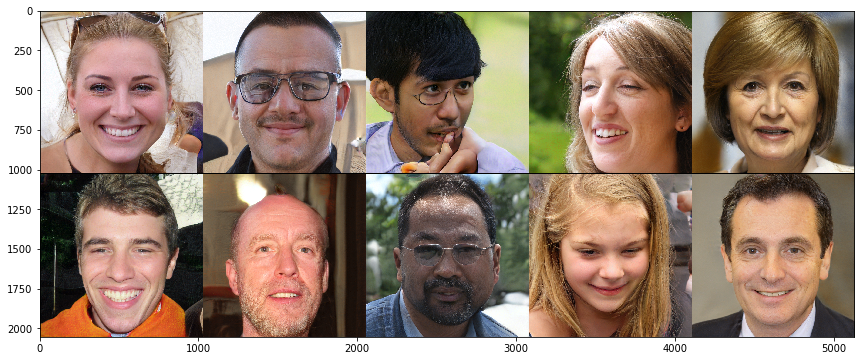

In [14]:
%matplotlib inline
from matplotlib import pyplot
import torchvision
device = 'cuda:0' if torch.cuda.is_available() else 'cpu'
g_all.eval()
g_all.to(device)

torch.manual_seed(20)
nb_rows = 2
nb_cols = 5
nb_samples = nb_rows * nb_cols
latents = torch.randn(nb_samples, 512, device=device)
with torch.no_grad():
    imgs = g_all(latents)
    imgs = (imgs.clamp(-1, 1) + 1) / 2.0 # normalization to 0..1 range
imgs = imgs.cpu()

imgs = torchvision.utils.make_grid(imgs, nrow=nb_cols)

pyplot.figure(figsize=(15, 6))
pyplot.imshow(imgs.permute(1, 2, 0).detach().numpy())

# Interpolation

The fancy way to interpolate latents of same lengths is to find a path between them on the centered sphere they lie (see e.g. [Ken Shoemake: Animating Rotation with Quaternion Curves](https://arxiv.org/abs/1609.04468)
and this [slerp example](https://github.com/soumith/dcgan.torch/issues/14)).
However, because the pixel norm at the very beginning projects onto the sphere, we can just take linear interpolation at the expense of a interpolation speed that is a bit slower at the ends of the paths than in the middle.

In [15]:
# # Get a few Images
# nb_latents = 25
# nb_interp = 2
# # torch.manual_seed(42)
# fixed_latents = [torch.randn(1, 512, device=device) for _ in range(nb_interp)]
# latents = []
# for i in range(len(fixed_latents)-1):
#     latents.append(fixed_latents[i] + (fixed_latents[i + 1] - fixed_latents[i]) * torch.arange(0, 1, 0.1, device=device).unsqueeze(1))
# latents.append(fixed_latents[-1])
# latents = torch.cat(latents, dim=0)

# %matplotlib inline
# with torch.no_grad():
#     for latent in latents:
#         latent = latent.to(device)
#         img = g_all(latent.unsqueeze(0))
#         img = img.clamp_(-1, 1).add_(1).div_(2.0)        
#         img = img.detach().squeeze(0).cpu().permute(1, 2, 0).numpy()
        
#         pyplot.imshow(img)
#         IPython.display.clear_output(True)
#         pyplot.show()

In [16]:
# # Get a few Images
# nb_latents = 25
# nb_interp = 2
# origin = torch.zeros(1, 512, device=device)
# step = origin.clone()
# step[0,450] += 0.001
# fixed_latents = [origin + step*i for i in range(nb_interp)]
# latents = []
# for i in range(len(fixed_latents)-1):
#     latents.append(fixed_latents[i] + (fixed_latents[i + 1] - fixed_latents[i]) * torch.arange(0, 1, 0.1, device=device).unsqueeze(1))
# latents.append(fixed_latents[-1])
# latents = torch.cat(latents, dim=0)

# %matplotlib inline
# with torch.no_grad():
#     for latent in latents:
#         latent = latent.to(device)
#         img = g_all(latent.unsqueeze(0))
#         img = img.clamp_(-1, 1).add_(1).div_(2.0)        
#         img = img.detach().squeeze(0).cpu().permute(1, 2, 0).numpy()
        
#         pyplot.imshow(img)
#         IPython.display.clear_output(True)
#         pyplot.show()

In [17]:
# # Get a few Images by varying W instead of Z
# nb_latents = 25
# nb_interp = 2
# origin = torch.zeros(1, 512, device=device)
# step = origin.clone()
# step[0,0] += 5
# fixed_latents = [origin + step*i for i in range(nb_interp)]
# latents = []
# for i in range(len(fixed_latents)-1):
#     latents.append(fixed_latents[i] + (fixed_latents[i + 1] - fixed_latents[i]) * torch.arange(0, 1, 0.1, device=device).unsqueeze(1))
# latents.append(fixed_latents[-1])
# latents = torch.cat(latents, dim=0)

# %matplotlib inline
# with torch.no_grad():
#     for latent in latents:
#         latent = latent.to(device)
#         latent = latent.repeat(18,1)
#         img = g_all[1](latent.unsqueeze(0))
#         img = img.clamp_(-1, 1).add_(1).div_(2.0)        
#         img = img.detach().squeeze(0).cpu().permute(1, 2, 0).numpy()
        
#         pyplot.imshow(img)
#         IPython.display.clear_output(True)
#         pyplot.show()

That is all for today. We hope you enjoyed this little walk-through.

We appreciate your feedback. Email us at Piotr <mail@pbialecki.de> and Thomas <tv@lernapparat.de>.

Also visit https://twitter.com/ptrblck_de and https://lernapparat.de/ for more great stuff.

In [20]:
from plot_utils import ShowModelOutput, ShowModelOutputFromInput, PlotReduceRandOrtho
from train_input import TrainInput
%load_ext autoreload
%autoreload 2

Model = g_all.to(device)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


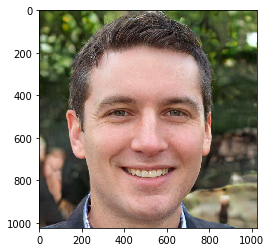

Epoch:  1
Feature loss:  0  | Pixel loss:  0.09338804334402084
Total loss:  93.38804626464844


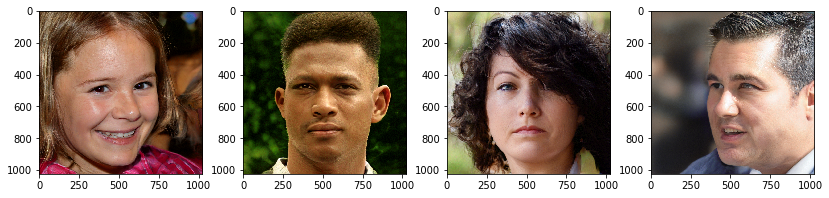

Epoch:  10
Feature loss:  0  | Pixel loss:  0.08246751874685287
Total loss:  82.46752166748047


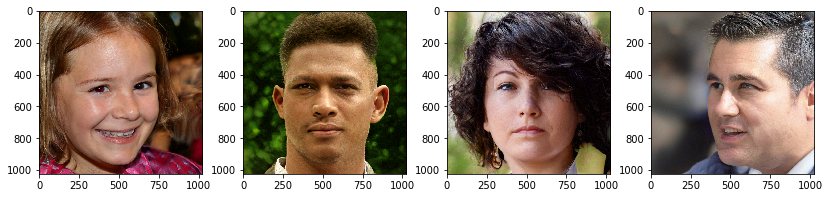

In [19]:
from get_features import GetFeatures
from PIL import Image

device = 'cuda:0' if torch.cuda.is_available() else 'cpu'

BatchSize = 4
LearnRate = 1e-3
torch.manual_seed(23)
ModelIn = torch.randn(BatchSize, 512, requires_grad=True, device=device)
Optimiser = torch.optim.Adam([ModelIn], lr=LearnRate)
for param in Model.parameters():
    param.requires_grad = False

TargetImage = np.array(Image.open('images/face1.png'))/255.0
plt.imshow(TargetImage)
plt.show()
TargetImage_tensor = torch.from_numpy(TargetImage).float().permute((2,0,1)).unsqueeze(0)
TargetImage_tensor = TargetImage_tensor.repeat(BatchSize,1,1,1).to(device)
TargetFeatures = GetFeatures(TargetImage_tensor)[2]

Epochs_n = 10
Weight_feature = 0
Weight_pixel = 1000
Loss = torch.tensor(0, device=device)
Loss_feature = torch.tensor(0, device=device)
Loss_pixel = torch.tensor(0, device=device)
Print_itvl = 10
for Epoch_i in range(1, Epochs_n+1):
    Optimiser.zero_grad()
    
    ModelOut = Model(ModelIn)
        
    ModelOut = ModelOut.clamp_(-1, 1).add_(1).div_(2.0)
    if Weight_feature > 0:
        OutFeatures = GetFeatures(ModelOut)[2]
        Loss_feature = nn.functional.mse_loss(OutFeatures,TargetFeatures)
        
    Loss_pixel = nn.functional.mse_loss(ModelOut, TargetImage_tensor)
    Loss = Weight_feature*Loss_feature + Weight_pixel*Loss_pixel
    Loss.backward()
    Optimiser.step()
    
    if Epoch_i == 1 or Epoch_i == Epochs_n+1 or Epoch_i % Print_itvl == 0:
        print('Epoch: ', Epoch_i)
        print('Feature loss: ', Loss_feature.item(), ' | Pixel loss: ', Loss_pixel.item())
        print('Total loss: ', Loss.item())
        ShowModelOutput(ModelOut)

In [20]:
# torch.save(ModelIn, 'BS4_face1.pt')

In [78]:
Face1_Faces = torch.load('latent_spaces/BS4_face1.pt')
Face1_Faces.shape

torch.Size([4, 512])

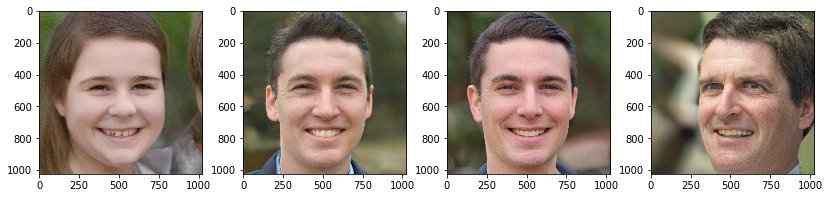

In [79]:
Model = g_all.to(device)
ShowModelOutputFromInput(Face1_Faces, Model)

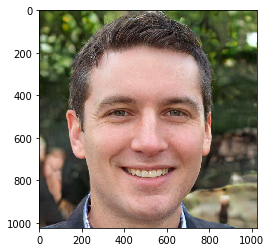

Epoch:  1
Feature loss:  0  | Pixel loss:  0.022744804620742798
Total loss:  22.74480438232422


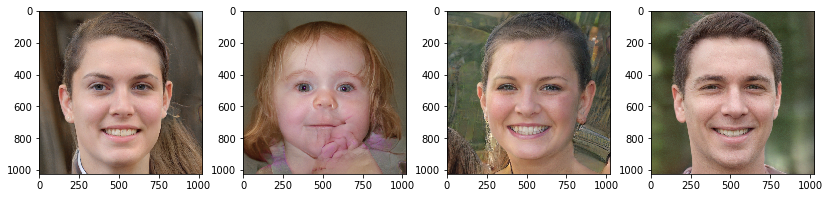

Epoch:  50
Feature loss:  0  | Pixel loss:  0.021604271605610847
Total loss:  21.604270935058594


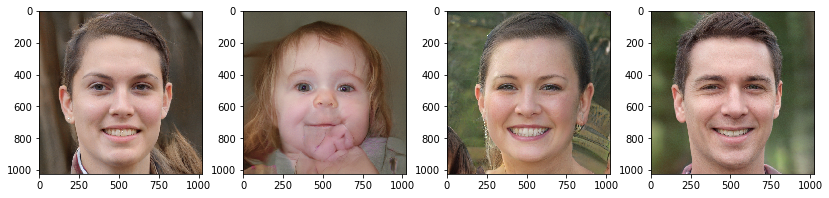

Epoch:  100
Feature loss:  0  | Pixel loss:  0.02032664231956005
Total loss:  20.326642990112305


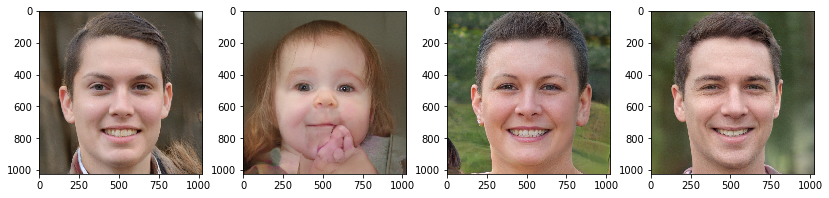

Epoch:  150
Feature loss:  0  | Pixel loss:  0.018935998901724815
Total loss:  18.935998916625977


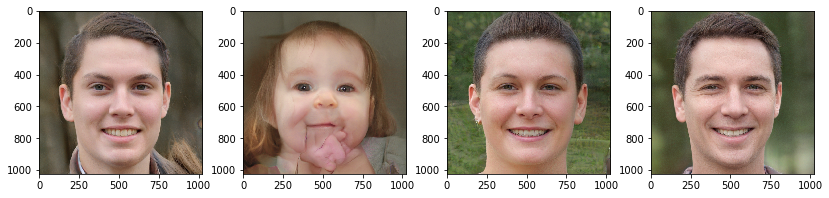

Epoch:  200
Feature loss:  0  | Pixel loss:  0.018439896404743195
Total loss:  18.439895629882812


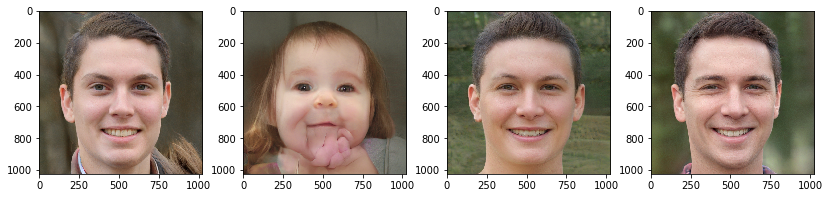

Epoch:  250
Feature loss:  0  | Pixel loss:  0.017716197296977043
Total loss:  17.716197967529297


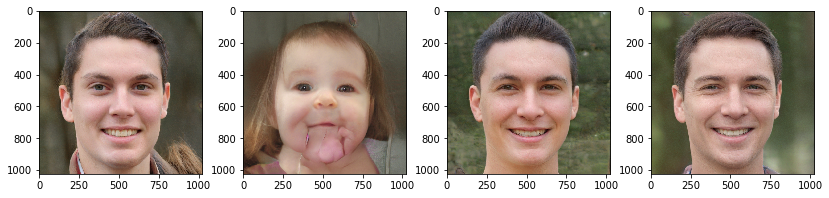

Epoch:  300
Feature loss:  0  | Pixel loss:  0.01754014380276203
Total loss:  17.540143966674805


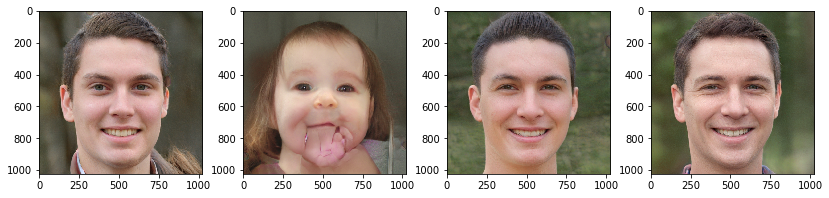

Epoch:  350
Feature loss:  0  | Pixel loss:  0.01739582046866417
Total loss:  17.39582061767578


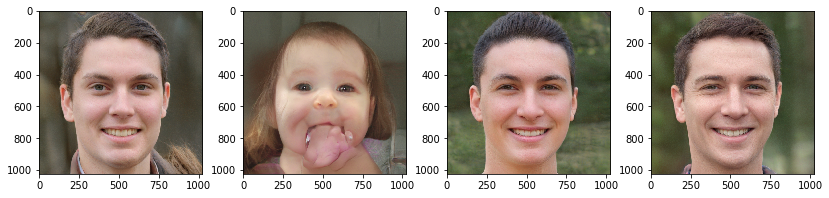

Epoch:  400
Feature loss:  0  | Pixel loss:  0.017498262226581573
Total loss:  17.498262405395508


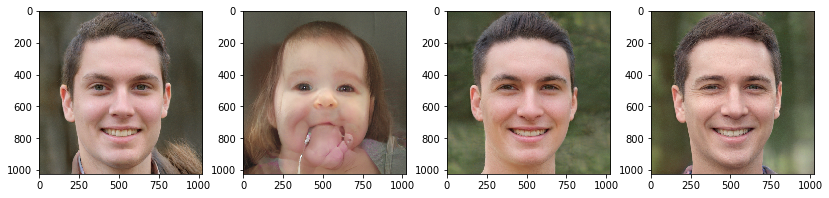

Epoch:  450
Feature loss:  0  | Pixel loss:  0.016706343740224838
Total loss:  16.706344604492188


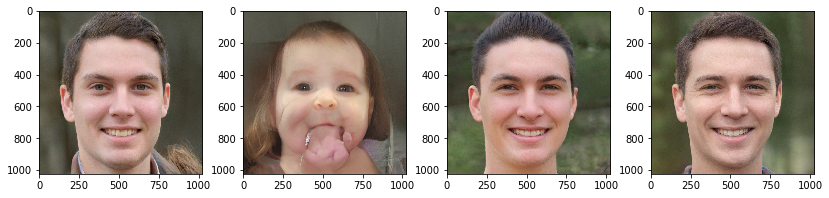

Epoch:  500
Feature loss:  0  | Pixel loss:  0.016883201897144318
Total loss:  16.883201599121094


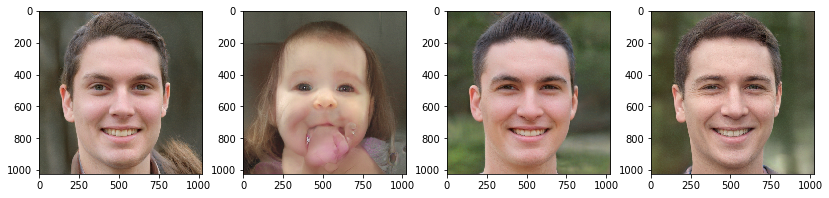

In [92]:
from get_features import GetFeatures
from PIL import Image

device = 'cuda:0' if torch.cuda.is_available() else 'cpu'

BatchSize = 4
LearnRate = 1e-2
torch.manual_seed(42)
# ModelIn = torch.randn(BatchSize, 512, requires_grad=True, device=device)
Optimiser = torch.optim.Adam([ModelIn], lr=LearnRate)
Model = g_all.to(device)
for param in Model.parameters():
    param.requires_grad = False

TargetImage = np.array(Image.open('images/face1.png'))/255.0
plt.imshow(TargetImage)
plt.show()
TargetImage_tensor = torch.from_numpy(TargetImage).float().permute((2,0,1)).unsqueeze(0)
TargetImage_tensor = TargetImage_tensor.repeat(BatchSize,1,1,1).to(device)
TargetFeatures = GetFeatures(TargetImage_tensor)[2]

Epochs_n = 500
Weight_feature = 0
Weight_pixel = 1000
Loss = torch.tensor(0, device=device)
Loss_feature = torch.tensor(0, device=device)
Loss_pixel = torch.tensor(0, device=device)
Print_itvl = 50
for Epoch_i in range(1, Epochs_n+1):
    Optimiser.zero_grad()
    
    ModelOut = Model(ModelIn)
        
    ModelOut = ModelOut.clamp_(-1, 1).add_(1).div_(2.0)
    if Weight_feature > 0:
        OutFeatures = GetFeatures(ModelOut)[2]
        Loss_feature = nn.functional.mse_loss(OutFeatures,TargetFeatures)
        
    Loss_pixel = nn.functional.mse_loss(ModelOut, TargetImage_tensor)
    Loss = Weight_feature*Loss_feature + Weight_pixel*Loss_pixel
    Loss.backward()
    Optimiser.step()
    
    if Epoch_i == 1 or Epoch_i == Epochs_n+1 or Epoch_i % Print_itvl == 0:
        print('Epoch: ', Epoch_i)
        print('Feature loss: ', Loss_feature.item(), ' | Pixel loss: ', Loss_pixel.item())
        print('Total loss: ', Loss.item())
        ShowModelOutput(ModelOut)

In [93]:
torch.save(ModelIn, 'latent_spaces/BS4_face1_2.pt')

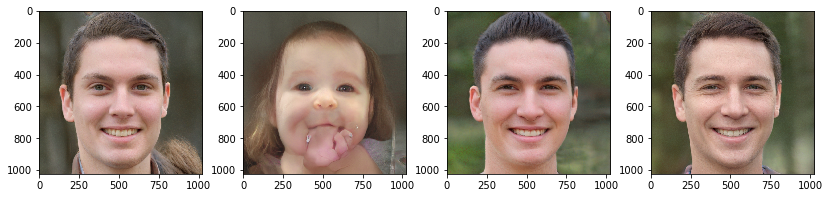

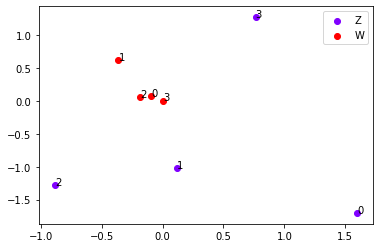

In [102]:
ShowModelOutputFromInput(ModelIn, Model)
PlotReduceRandOrtho(ModelIn, Model)

Target Face


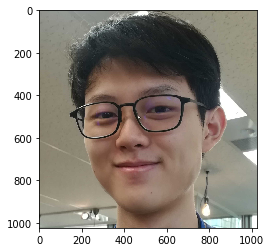

Epoch:  1
Feature loss:  0  | Pixel loss:  0.0975935161113739
Total loss:  97.59351348876953


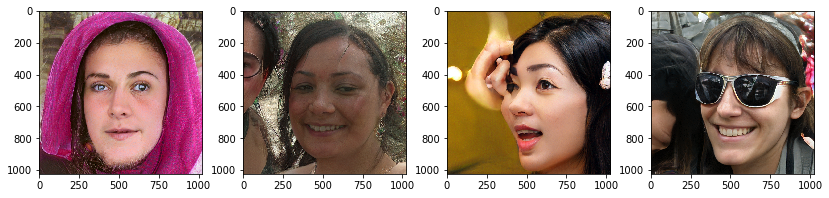

Epoch:  10
Feature loss:  0  | Pixel loss:  0.05468108132481575
Total loss:  54.68107986450195


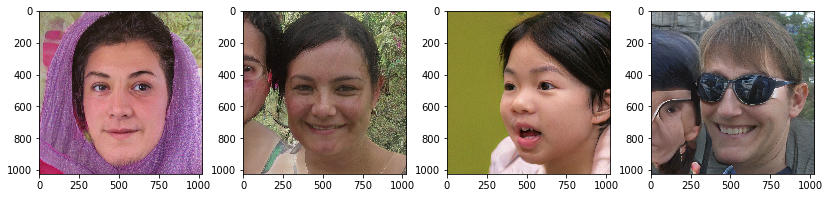

Epoch:  20
Feature loss:  0  | Pixel loss:  0.03902272507548332
Total loss:  39.02272415161133


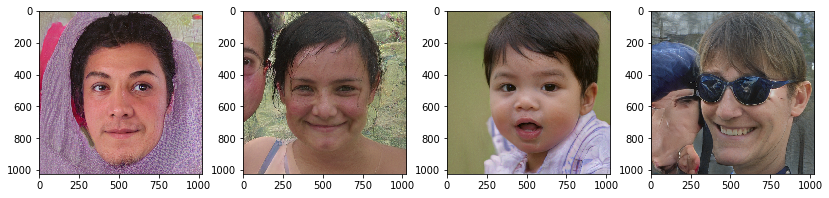

Epoch:  30
Feature loss:  0  | Pixel loss:  0.031114213168621063
Total loss:  31.114213943481445


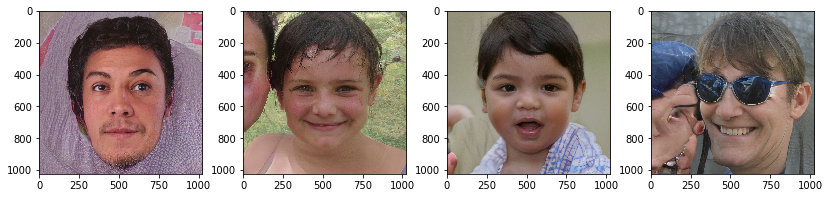

Epoch:  40
Feature loss:  0  | Pixel loss:  0.02763109654188156
Total loss:  27.63109588623047


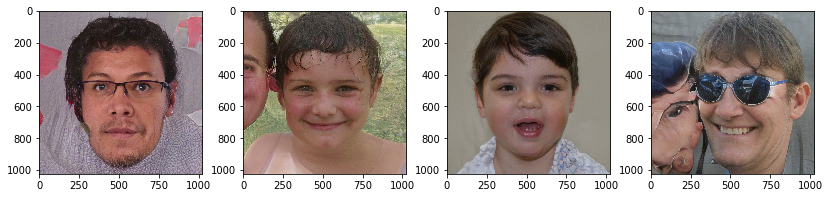

Epoch:  50
Feature loss:  0  | Pixel loss:  0.02595333941280842
Total loss:  25.953338623046875


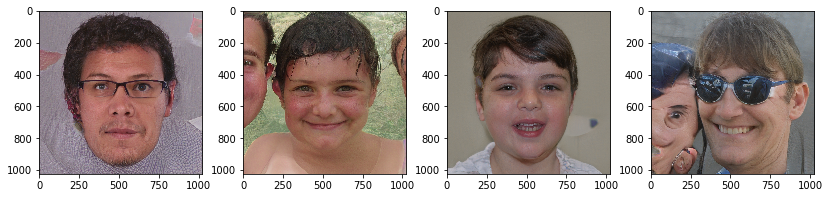

Epoch:  60
Feature loss:  0  | Pixel loss:  0.024636471644043922
Total loss:  24.636470794677734


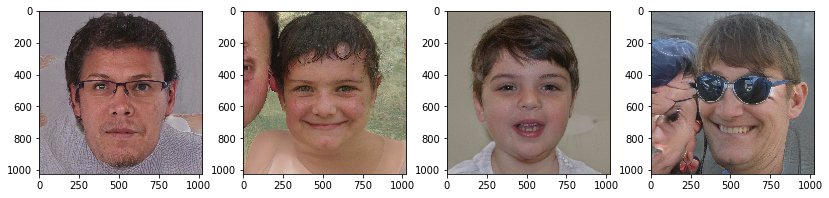

Epoch:  70
Feature loss:  0  | Pixel loss:  0.024061007425189018
Total loss:  24.061006546020508


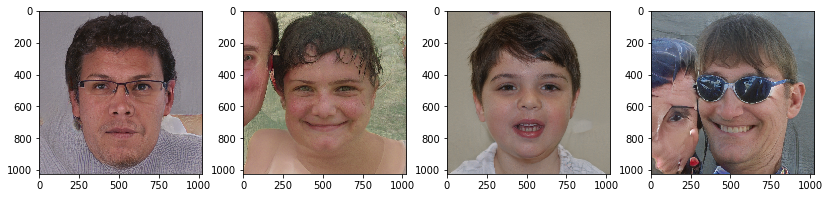

Epoch:  80
Feature loss:  0  | Pixel loss:  0.022993825376033783
Total loss:  22.993825912475586


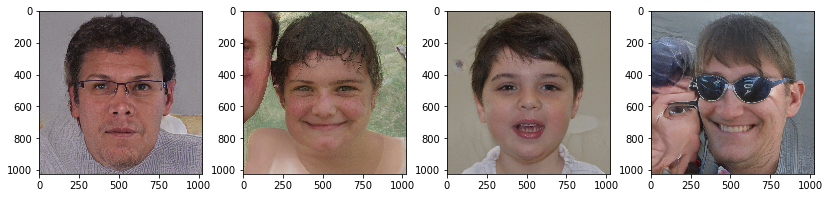

Epoch:  90
Feature loss:  0  | Pixel loss:  0.02156657539308071
Total loss:  21.56657600402832


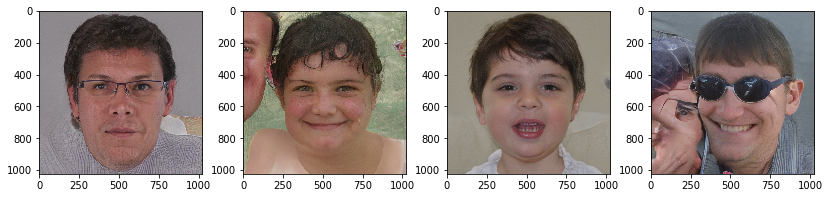

Epoch:  100
Feature loss:  0  | Pixel loss:  0.020442306995391846
Total loss:  20.442306518554688


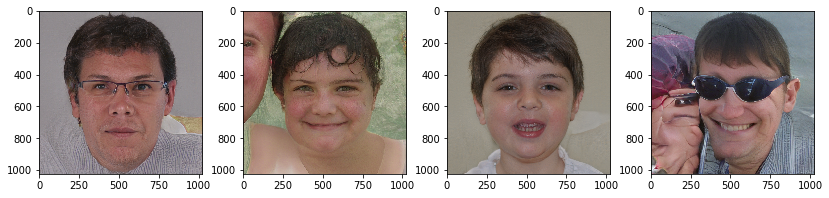

In [23]:
BatchSize = 4
LearnRate = 1e-2
torch.manual_seed(100)
ModelIn = torch.randn(BatchSize, 512, requires_grad=True, device=device)
TargetPath = 'images/tsehao#1.png'
Epochs_n =100
TrainInput(Model, ModelIn, TargetPath, Epochs_n, 1e-2)

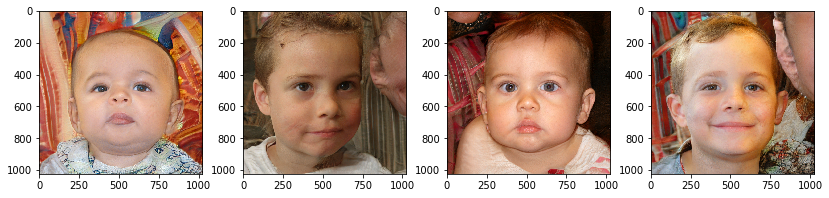

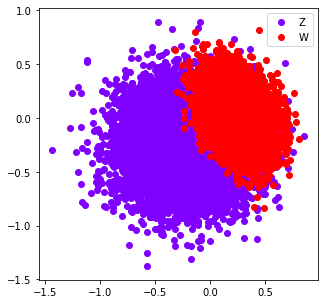

In [30]:
ModelIn = torch.rand(10000, 512, device=device)
ShowModelOutputFromInput(ModelIn[0:4,:], Model)
PlotReduceRandOrtho(ModelIn, Model, Annotate=False)